In [2]:
# packages and initial data import

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import operator
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score, cross_val_predict
import category_encoders as ce
from sklearn import metrics, linear_model, tree, preprocessing, ensemble, svm
from sklearn.metrics import accuracy_score, confusion_matrix, silhouette_score,\
                            roc_auc_score, precision_score, recall_score
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import normalize, power_transform, PowerTransformer
from scipy.stats import boxcox
from datetime import datetime, timedelta
import warnings

pd.set_option('display.max_columns', None) # display all columns
warnings.simplefilter('ignore')   #suppress warning messages 

training = pd.read_csv('Train_Churn_binary.csv', header = 0)
testing = pd.read_csv('Test_Churn.csv', header = 0)

In [9]:
training[training['TotalCharges'] == ' ']

,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
989,2775-SEFEE,Male,0,No,Yes,0,Yes,Yes,DSL,Yes,Yes,No,Yes,No,No,Two year,Yes,Bank transfer (automatic),61.90,,0
1006,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,0
1867,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,0
3081,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,0
3339,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,0
4476,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,0
4923,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,0


In [2]:
print(training.shape)
training.head(10)

(5282, 21)


,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0980-PVMRC,Female,0,Yes,Yes,40,No,No phone service,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,50.85,2036.55,0
1,4143-OOBWZ,Male,0,Yes,No,5,Yes,Yes,Fiber optic,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,81.30,416.3,1
2,4890-VMUAV,Male,0,No,No,63,Yes,Yes,DSL,Yes,Yes,Yes,Yes,No,No,One year,No,Electronic check,71.50,4576.3,0
3,2908-ZTPNF,Female,0,No,No,36,No,No phone service,DSL,No,Yes,No,Yes,No,No,Month-to-month,Yes,Bank transfer (automatic),34.85,1267.2,0
4,4450-MDZFX,Male,0,Yes,Yes,60,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,No,Bank transfer (automatic),74.35,4453.3,0
5,3597-MVHJT,Female,0,No,No,27,Yes,Yes,Fiber optic,No,No,No,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),95.60,2595.25,0
6,9974-JFBHQ,Male,0,No,Yes,64,Yes,No,Fiber optic,No,Yes,No,Yes,Yes,Yes,Month-to-month,Yes,Credit card (automatic),99.15,6171.2,0
7,6341-AEVKX,Female,0,Yes,No,62,Yes,No,Fiber optic,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Electronic check,104.30,6613.65,0
8,2867-UIMSS,Male,0,No,No,1,Yes,No,Fiber optic,No,No,No,No,No,Yes,Month-to-month,No,Electronic check,80.50,80.5,1
9,5222-IMUKT,Male,0,No,No,32,Yes,No,Fiber optic,No,No,No,No,Yes,Yes,Month-to-month,No,Electronic check,91.05,2871.5,0


In [3]:
training.dtypes

Customer Number      object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                 int64
dtype: object

In [4]:
training.corr()

,SeniorCitizen,tenure,MonthlyCharges,Churn
SeniorCitizen,1.000000,0.016098,0.216524,0.145914
tenure,0.016098,1.000000,0.246406,-0.361497
MonthlyCharges,0.216524,0.246406,1.000000,0.180156
Churn,0.145914,-0.361497,0.180156,1.000000


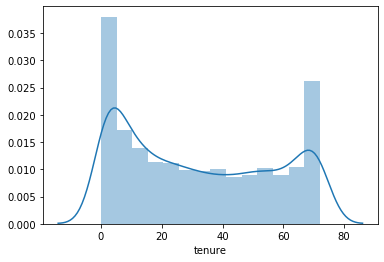

In [5]:
sns.distplot(training.tenure)

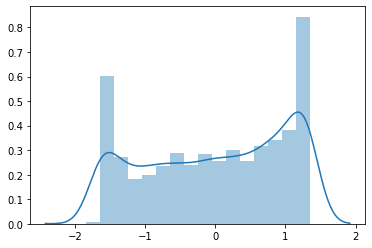

In [8]:
#checck dist after power transfor,
PT = PowerTransformer()
tenure_array = training['tenure'].to_numpy().reshape(-1,1)
tenure_array = tenure_array + 0.001
xform_array = PT.fit_transform(tenure_array)

sns.distplot(xform_array)

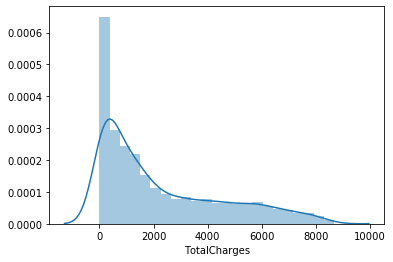

In [11]:
training['TotalCharges'] = training['TotalCharges'].replace({" ": 0}) #replace 'space' missing values with 0
training['TotalCharges'] = training['TotalCharges'].astype(float)
sns.distplot(training.TotalCharges)

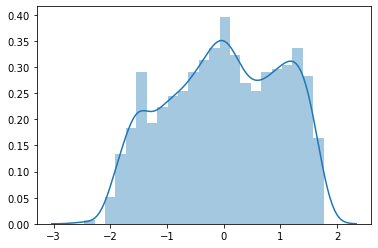

In [12]:
# check dist with power transform
PT = PowerTransformer()
charge_array = training['TotalCharges'].to_numpy().reshape(-1,1)
#charge_array = tenure_array + 0.001
xform_charge = PT.fit_transform(charge_array)

sns.distplot(xform_charge)

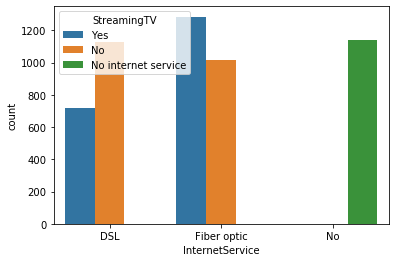

In [5]:
sns.countplot('InternetService', hue = 'StreamingTV', data = training)

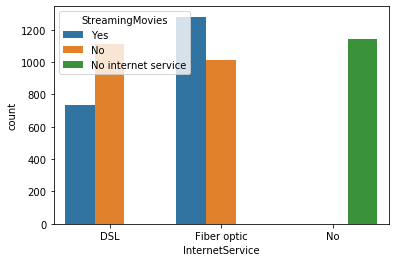

In [6]:
sns.countplot('InternetService', hue = 'StreamingMovies', data = training)

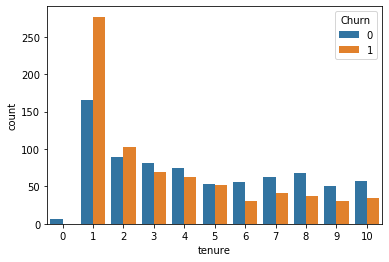

In [68]:
less_10 = training[training['tenure'] <= 10]
sns.countplot('tenure', hue = 'Churn', data = less_10)

In [97]:
training[(training['tenure'] == 1) & (training['InternetService'] == 'Fiber optic')]\
                                 .iloc[:,[8,9,10,11,12,13,14,15,17,18,20]].head(n=20)

,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaymentMethod,MonthlyCharges,Churn
8,Fiber optic,No,No,No,No,No,Yes,Month-to-month,Electronic check,80.50,1
127,Fiber optic,No,No,No,No,No,No,Month-to-month,Electronic check,69.10,1
180,Fiber optic,No,No,No,No,No,No,Month-to-month,Electronic check,69.65,1
207,Fiber optic,No,No,No,No,Yes,No,Month-to-month,Electronic check,78.05,1
225,Fiber optic,No,No,No,No,No,No,Month-to-month,Electronic check,71.15,1
267,Fiber optic,Yes,Yes,No,Yes,No,No,Month-to-month,Mailed check,83.40,0
283,Fiber optic,No,No,Yes,No,No,No,Month-to-month,Credit card (automatic),75.35,0
319,Fiber optic,No,No,No,No,No,No,Month-to-month,Electronic check,68.50,1
337,Fiber optic,No,No,No,No,Yes,No,Month-to-month,Mailed check,80.05,1
443,Fiber optic,No,No,No,No,No,No,Month-to-month,Mailed check,70.90,1


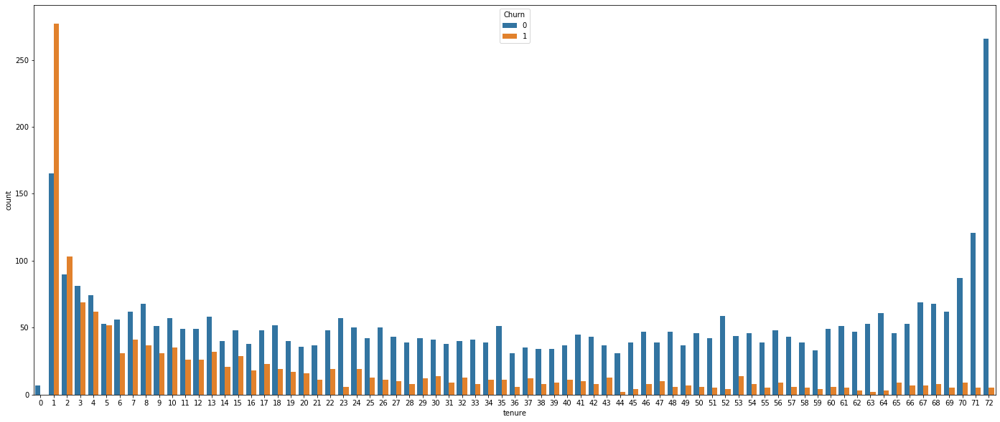

In [5]:
fig, axs = plt.subplots(figsize = (24,10))
sns.countplot('tenure', hue = 'Churn', data = training)

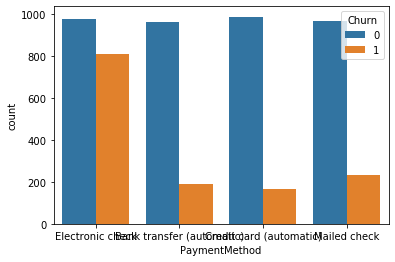

In [104]:
sns.countplot('PaymentMethod', hue = 'Churn', data = training)

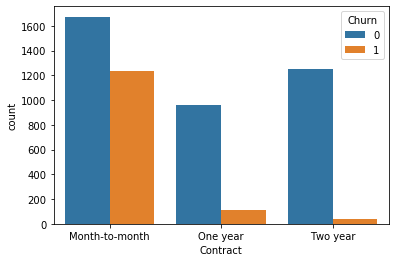

In [105]:
sns.countplot('Contract', hue = 'Churn', data = training)

In [117]:
hmm = pd.DataFrame()
hmm['tenure'] = training['tenure']
hmm['max_minus_tenure'] = max(training['tenure']) - hmm['tenure']
hmm[['Contract','PaymentMethod']] = training[['Contract','PaymentMethod']]

def risky_risk(row):
    if row['Contract'] == 'Month-to-month' and 'check' in row['PaymentMethod'] and row['tenure'] <=6:
        return 'high'
    elif row['tenure'] >= 6 and row['Contract'] == 'Month-to-month':
        return 'medium'
    else:
        return 'low'

hmm['risk'] = hmm.apply(risky_risk, axis = 1)
hmm

,tenure,max_minus_tenure,Contract,PaymentMethod,risk
0,40,32,Month-to-month,Electronic check,medium
1,5,67,Month-to-month,Electronic check,high
2,63,9,One year,Electronic check,low
3,36,36,Month-to-month,Bank transfer (automatic),medium
4,60,12,Month-to-month,Bank transfer (automatic),medium
...,...,...,...,...,...
5277,31,41,Month-to-month,Credit card (automatic),medium
5278,43,29,Month-to-month,Credit card (automatic),medium
5279,66,6,Two year,Credit card (automatic),low
5280,72,0,Two year,Bank transfer (automatic),low


In [27]:
def bandwidth_use(row):
    if row['InternetService'] != 'No':
        if row['StreamingTV'] and row['StreamingMovies']  == 'Yes':
            return 'high'
        elif row['StreamingTV'] and row['StreamingMovies'] and row['OnlineBackup'] == 'No':
            return 'low'
        elif row['StreamingTV'] or row['StreamingMovies'] or row['OnlineBackup'] == 'Yes':
            return 'medium'
    else:
        return 'none'

training['bandwidth_use'] =  training.apply(bandwidth_use, axis = 1)

In [7]:
training.head(n=100)

,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,bandwidth_use
0,0980-PVMRC,Female,0,Yes,Yes,40,No,No phone service,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,50.85,2036.55,0,high
1,4143-OOBWZ,Male,0,Yes,No,5,Yes,Yes,Fiber optic,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,81.30,416.30,1,medium
2,4890-VMUAV,Male,0,No,No,63,Yes,Yes,DSL,Yes,Yes,Yes,Yes,No,No,One year,No,Electronic check,71.50,4576.30,0,medium
3,2908-ZTPNF,Female,0,No,No,36,No,No phone service,DSL,No,Yes,No,Yes,No,No,Month-to-month,Yes,Bank transfer (automatic),34.85,1267.20,0,medium
4,4450-MDZFX,Male,0,Yes,Yes,60,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,No,Bank transfer (automatic),74.35,4453.30,0,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,5766-ZJYBB,Male,0,No,No,1,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,19.40,19.40,1,none
96,4366-CTOUZ,Female,0,No,No,50,Yes,No,Fiber optic,No,Yes,No,Yes,Yes,Yes,Two year,Yes,Mailed check,100.20,5038.45,0,high
97,8650-RHRKE,Male,0,No,No,4,No,No phone service,DSL,No,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,29.65,118.50,1,low
98,5844-QVTAT,Female,0,Yes,Yes,33,Yes,No,DSL,Yes,Yes,Yes,No,No,No,One year,Yes,Mailed check,58.45,1955.40,0,medium


In [ ]:
def mismatch(row):
    if row['InternetService'] == 'Fiber optic' and (row['bandwidth_use'] == 'low' or row['bandwidth_use'] == 'none'):
        return 'yes'
    elif row['InternetService'] == 'DSL' and row['bandwidth_use'] == 'high':
        return 'yes'
    else:
        return 'no'
                                                    
training['mismatch'] = training.apply(mismatch, axis = 1)                                                  

In [10]:
training.describe(include = 'all')

,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,bandwidth_use,mismatch
count,5282,5282,5282.000000,5282,5282,5282.000000,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282.000000,5282.000000,5282.000000,5282,5282
unique,5282,2,NaN,2,2,NaN,2,3,3,3,3,3,3,3,3,3,2,4,NaN,NaN,NaN,4,2
top,4576-CSAJH,Male,NaN,No,No,NaN,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,NaN,NaN,NaN,high,no
freq,1,2675,NaN,2751,3682,NaN,4768,2572,2297,2623,2310,2315,2625,2141,2126,2913,3109,1782,NaN,NaN,NaN,2015,3883
mean,NaN,NaN,0.157327,NaN,NaN,32.138205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.504468,2254.555377,0.263915,NaN,NaN
std,NaN,NaN,0.364143,NaN,NaN,24.555534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.969362,2257.232326,0.440796,NaN,NaN
min,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.250000,0.000000,0.000000,NaN,NaN
25%,NaN,NaN,0.000000,NaN,NaN,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.500000,395.037500,0.000000,NaN,NaN
50%,NaN,NaN,0.000000,NaN,NaN,28.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.200000,1373.625000,0.000000,NaN,NaN
75%,NaN,NaN,0.000000,NaN,NaN,55.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.737500,3728.737500,1.000000,NaN,NaN


In [5]:
# check out 0 tenure customers

print(len(training[training['tenure'] == 0]))

training[training['tenure'] == 0]

7


,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
989,2775-SEFEE,Male,0,No,Yes,0,Yes,Yes,DSL,Yes,Yes,No,Yes,No,No,Two year,Yes,Bank transfer (automatic),61.90,,0
1006,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,0
1867,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,0
3081,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,0
3339,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,0
4476,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,0
4923,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,0


In [6]:
# checking that all 'no internet service' customers have no internet service for all products.
training[training['InternetService'] == 'No']

,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
11,1074-WVEVG,Female,0,Yes,No,59,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,No,Mailed check,20.35,1267,0
14,9585-KKMFD,Male,0,Yes,Yes,41,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,Yes,Mailed check,20.00,879.8,0
15,2324-AALNO,Female,0,No,No,48,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,No,Bank transfer (automatic),24.55,1203.95,0
17,6849-WLEYG,Male,0,No,Yes,1,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,19.75,19.75,1
24,3785-KTYSH,Male,0,No,No,53,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,24.60,1279,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5255,6549-YMFAW,Male,1,Yes,No,9,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,Yes,Mailed check,21.25,204.55,0
5260,5066-GFJMM,Female,0,Yes,No,3,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,Yes,Mailed check,19.90,45.75,0
5274,2266-FUBDZ,Male,0,Yes,Yes,15,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.35,278.85,0
5275,3097-PYWXL,Female,0,Yes,Yes,4,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,Yes,Electronic check,19.95,82.9,0


In [57]:
"""
# drop the records where tenure = 0
training = training[training['tenure'] != 0]
training.shape
"""

(5275, 21)

In [7]:
# check for null values
print(training.isnull().sum())

Customer Number     0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64


In [116]:
training['InternetService'].unique()

array(['DSL', 'Fiber optic', 'No'], dtype=object)

In [109]:
def do_data(df, has_y = True, return_df = False):
    """
    Takes as input a dataframe of customer churn data and returns dataframe X and series y.
    Useful for repeatedly & consistently transforming & prepping data for modeling.
    All columns of dtype 'object' will be converted to categorical.
    
    Parameters
    ----------
    df : dataframe
    has_y : flag to indicate if df contains labeled churn outcome. default = True
    return_df : flag to have function return non-split dataframe. 
    
    Returns
    -------
    X : dataframe of input data
    y : series of labeled outcomes
    df : cleaned/transformed dataframe
    """

    df.columns = map(str.lower, df.columns) # all column headers to lower case
    
    if df['totalcharges'].dtype == 'object': 
        df['totalcharges'] = df['totalcharges'].replace({" ": 0}) #replace 'space' missing values with 0
        df['totalcharges'] = df['totalcharges'].astype(float)
    
    """PT = PowerTransformer()                                   ###
    charge_array = df['totalcharges'].to_numpy().reshape(-1,1)  ### added on 2/9
    df['totalcharges'] = PT.fit_transform(charge_array)       ###"""
             
    df['seniorcitizen'] = df['seniorcitizen'].astype('category')
    
    def bandwidth_use(row):
        if row['internetservice'] != 'No':
            if row['streamingtv'] and row['streamingmovies']  == 'Yes':
                return 'high'
            elif row['streamingtv'] and row['streamingmovies'] and row['onlinebackup'] == 'No':
                return 'low'
            elif row['streamingtv'] or row['streamingmovies'] or row['onlinebackup'] == 'Yes':
                return 'medium'
        else:
            return 'none'

    df['bandwidth_use'] =  df.apply(bandwidth_use, axis = 1)
    
    def mismatch(row):
        if row['internetservice'] == 'Fiber optic' and (row['bandwidth_use'] == 'low' or row['bandwidth_use'] == 'none'):
            return 'yes'
        elif row['internetservice'] == 'DSL' and row['bandwidth_use'] == 'high':
            return 'yes'
        else:
            return 'no'
                                                    
    df['mismatch'] = df.apply(mismatch, axis = 1)    
    
        # loop over df and convert all object dtype columns to categorical
    for i in df.columns:
        if df[i].dtype == object:
            df[i] = df[i].astype('category')

    # encode outcome and convert to int
    if return_df == False:
        if has_y == True: 
            X = df.drop(columns=['churn','customer number'])#, 'bandwidth_use', 'mismatch'])
            y = df['churn']
            return X, y
        else:
            X = df.drop(columns=['customer number'])
            return X
    else:
        return df

### Can run all cells below 

In [110]:
training = pd.read_csv('Train_Churn_binary.csv', header = 0)
testing = pd.read_csv('Test_Churn.csv', header = 0)

In [111]:
training['max_minus_tenure'] = max(training['tenure']) - training['tenure']
training[['Contract','PaymentMethod']] = training[['Contract','PaymentMethod']]

def risky_risk(row):
    if row['Contract'] == 'Month-to-month' and 'check' in row['PaymentMethod'] and row['tenure'] <=6:
        return 'high'
    elif row['tenure'] >= 6 and row['Contract'] == 'Month-to-month':
        return 'medium'
    else:
        return 'low'

training['risk'] = training.apply(risky_risk, axis = 1)
training

,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,max_minus_tenure,risk
0,0980-PVMRC,Female,0,Yes,Yes,40,No,No phone service,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,50.85,2036.55,0,32,medium
1,4143-OOBWZ,Male,0,Yes,No,5,Yes,Yes,Fiber optic,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,81.30,416.3,1,67,high
2,4890-VMUAV,Male,0,No,No,63,Yes,Yes,DSL,Yes,Yes,Yes,Yes,No,No,One year,No,Electronic check,71.50,4576.3,0,9,low
3,2908-ZTPNF,Female,0,No,No,36,No,No phone service,DSL,No,Yes,No,Yes,No,No,Month-to-month,Yes,Bank transfer (automatic),34.85,1267.2,0,36,medium
4,4450-MDZFX,Male,0,Yes,Yes,60,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,No,Bank transfer (automatic),74.35,4453.3,0,12,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5277,7869-ZYDST,Male,0,Yes,No,31,Yes,Yes,DSL,No,No,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),59.05,1882.8,0,41,medium
5278,2842-BCQGE,Male,0,No,No,43,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Credit card (automatic),75.35,3161.4,0,29,medium
5279,9800-OUIGR,Male,0,Yes,Yes,66,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic),20.00,1374.2,0,6,low
5280,7301-ABVAD,Female,0,No,No,72,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,Yes,Two year,No,Bank transfer (automatic),86.60,6350.5,0,0,low


In [112]:
# clean training data
X, y = do_data(training, has_y = True)
#X = X.drop(columns = ['tenure','max_minus_tenure','totalcharges' ])
X.describe(include = 'all')

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,max_minus_tenure,risk,bandwidth_use,mismatch
count,5282,5282.0,5282,5282,5282.000000,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282,5282.000000,5282.000000,5282.000000,5282,5282,5282
unique,2,2.0,2,2,NaN,2,3,3,3,3,3,3,3,3,3,2,4,NaN,NaN,NaN,3,4,2
top,Male,0.0,No,No,NaN,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,NaN,NaN,NaN,low,high,no
freq,2675,4451.0,2751,3682,NaN,4768,2572,2297,2623,2310,2315,2625,2141,2126,2913,3109,1782,NaN,NaN,NaN,2519,2015,3883
mean,NaN,NaN,NaN,NaN,32.138205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.504468,2254.555377,39.861795,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,24.555534,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.969362,2257.232326,24.555534,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.250000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.500000,395.037500,17.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,28.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.200000,1373.625000,44.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,55.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,89.737500,3728.737500,64.000000,NaN,NaN,NaN


In [140]:
X['tenure-1'] = 1 / (X['tenure'] + 0.001)
X['monthlycharges-1'] = 1 / X['monthlycharges']
X['totalcharges-1'] = 1 / (X['totalcharges'] + 0.001)
X['tenure:payment'] = (X['tenure'] + .001) / (X['monthlycharges'] + .001)

In [137]:
X['totalcharges-1'].describe()

count    5282.000000
mean             inf
std              NaN
min         0.000115
25%         0.000268
50%         0.000728
75%         0.002531
max              inf
Name: totalcharges-1, dtype: float64

In [138]:
X['monthlycharges-1'].describe()

count    5282.000000
mean        0.021822
std         0.014823
min         0.008421
25%         0.011144
50%         0.014245
75%         0.028169
max         0.054795
Name: monthlycharges-1, dtype: float64

In [139]:
X['tenure-1'].describe()

count    5282.000000
mean             inf
std              NaN
min         0.013889
25%         0.018182
50%         0.035714
75%         0.125000
max              inf
Name: tenure-1, dtype: float64

In [136]:
X['tenure:payment'].describe()

count    5282.000000
mean        0.646463
std         0.728889
min         0.000136
25%         0.147533
50%         0.459999
75%         0.784543
max         3.729156
Name: tenure:payment, dtype: float64

In [125]:
cohortcount = X['tenure'].value_counts()
X['cohortcount'] = 0

for i in range(0,len(X)):
    X['cohortcount'][i] = cohortcount[X['tenure'].iloc[i]]

In [126]:
#check that the above worked
X[['tenure','cohortcount']]

,tenure,cohortcount
0,40,48
1,5,105
2,63,55
3,36,37
4,60,55
...,...,...
5277,31,47
5278,43,50
5279,66,60
5280,72,271


In [127]:
#def product_count(row):
#    return sum(row[6:14] == 'Yes')
#
#training['prod_count'] = training.apply(product_count, axis = 1)

X['prod_count'] = X.apply(lambda row:sum(row[6:15] == 'Yes') , axis = 1)

In [117]:
X

,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,max_minus_tenure,risk,bandwidth_use,mismatch,tenure-1,monthlycharges-1,totalcharges-1,tenure:payment,cohortcount,prod_count
0,Female,0,Yes,Yes,40,No,No phone service,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,50.85,2036.55,32,medium,high,yes,0.025000,0.019666,0.000491,0.786627,48,3
1,Male,0,Yes,No,5,Yes,Yes,Fiber optic,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,81.30,416.30,67,high,medium,no,0.200000,0.012300,0.002402,0.061501,105,2
2,Male,0,No,No,63,Yes,Yes,DSL,Yes,Yes,Yes,Yes,No,No,One year,No,Electronic check,71.50,4576.30,9,low,medium,no,0.015873,0.013986,0.000219,0.881119,55,5
3,Female,0,No,No,36,No,No phone service,DSL,No,Yes,No,Yes,No,No,Month-to-month,Yes,Bank transfer (automatic),34.85,1267.20,36,medium,medium,no,0.027778,0.028694,0.000789,1.032999,37,2
4,Male,0,Yes,Yes,60,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,No,Bank transfer (automatic),74.35,4453.30,12,medium,low,yes,0.016667,0.013450,0.000225,0.806994,55,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5277,Male,0,Yes,No,31,Yes,Yes,DSL,No,No,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),59.05,1882.80,41,medium,low,no,0.032258,0.016935,0.000531,0.524979,47,2
5278,Male,0,No,No,43,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Credit card (automatic),75.35,3161.40,29,medium,low,yes,0.023256,0.013271,0.000316,0.570670,50,1
5279,Male,0,Yes,Yes,66,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Credit card (automatic),20.00,1374.20,6,low,none,no,0.015152,0.050000,0.000728,3.300000,60,0
5280,Female,0,No,No,72,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,Yes,Two year,No,Bank transfer (automatic),86.60,6350.50,0,low,high,yes,0.013889,0.011547,0.000157,0.831409,271,6


In [72]:
#test performance of different encoding methods
encoders = (
ce.BackwardDifferenceEncoder(),
ce.BaseNEncoder(),
ce.BinaryEncoder(),
ce.CatBoostEncoder(),
ce.HashingEncoder(),
ce.HelmertEncoder(),
ce.JamesSteinEncoder(),
ce.LeaveOneOutEncoder(),
ce.MEstimateEncoder(),
ce.OneHotEncoder(),
ce.OrdinalEncoder(),
ce.SumEncoder(),
ce.PolynomialEncoder(),
ce.TargetEncoder(),
ce.WOEEncoder()
)

for encoder in encoders:
    encoder.fit(X,y)
    X = encoder.transform(X)
    x_train, x_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.20,
                                                    random_state = 5)

(BackwardDifferenceEncoder(cols=None, drop_invariant=False,
                           handle_missing='value', handle_unknown='value',
                           mapping=None, return_df=True, verbose=0),
 BaseNEncoder(base=2, cols=None, drop_invariant=False, handle_missing='value',
              handle_unknown='value', mapping=None, return_df=True, verbose=0),
 BinaryEncoder(cols=None, drop_invariant=False, handle_missing='value',
               handle_unknown='value', mapping=None, return_df=True, verbose=0),
 CatBoostEncoder(a=1, cols=None, drop_invariant=False, handle_missing='value',
                 handle_unknown='value', random_state=None, return_df=True,
                 sigma=None, verbose=0),
 HashingEncoder(cols=None, drop_invariant=False, hash_method='md5',
                max_process=4, max_sample=0, n_components=8, return_df=True,
                verbose=0),
 HelmertEncoder(cols=None, drop_invariant=False, handle_missing='value',
                handle_unknown='value', ma

In [141]:
# encode input variabes; test-train split

encoder = ce.OneHotEncoder()  #One hot should be good for low cardinality categories.  Test others??
encoder.fit(X,y)
X = encoder.transform(X)

x_train, x_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.20,
                                                    random_state = 5)

In [149]:
lr_model = linear_model.LogisticRegression(random_state = 123)
scores = cross_val_score(lr_model,
                         x_train,
                         y_train,
                         cv = 10,
                        scoring = 'roc_auc')
print(np.mean(scores))
scores

0.8511436623172088


array([0.83639925, 0.83918129, 0.8427298 , 0.8534889 , 0.86055901,
       0.82843472, 0.83811802, 0.87050011, 0.87710754, 0.86491798])

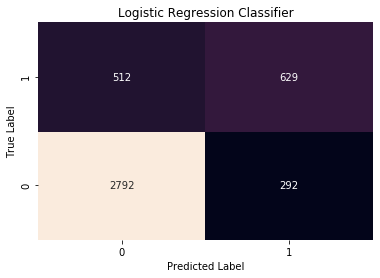

In [143]:
cv_pred = cross_val_predict(lr_model, x_train, y_train, cv = 10)
result_mat = confusion_matrix(y_train,cv_pred)
sns.heatmap(result_mat,
            # square = True,
            annot = True,
            fmt = 'd',
            cbar = False)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Logistic Regression Classifier')
plt.ylim(0,2)
plt.show()

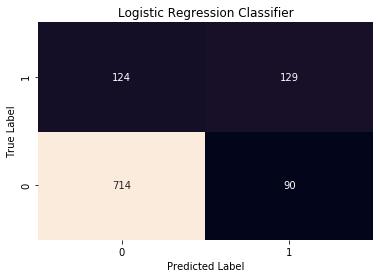

Accuracy Score 0.7975402081362346
AUC 0.8382445480109335
Precision score 0.589041095890411
Recall score 0.5098814229249012


In [150]:
# logit
lr_model = linear_model.LogisticRegression(random_state = 123)
lr_model.fit(x_train, y_train)
lr_pred = lr_model.predict(x_test)
lr_proba = lr_model.predict_proba(x_test)
lr_proba = lr_proba[:,1]
lr_auc = roc_auc_score(y_test, lr_proba)
lr_score = lr_model.score(x_test,y_test)
lr_recall = recall_score(y_test, lr_pred)
lr_precision  = precision_score(y_test, lr_pred)
lr_result_mat = confusion_matrix(y_test,lr_pred)

sns.heatmap(lr_result_mat,
            # square = True,
            annot = True,
            fmt = 'd',
            cbar = False)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Logistic Regression Classifier')
plt.ylim(0,2)
plt.show()

print('Accuracy Score {}'.format(lr_score))
print('AUC {}'.format(lr_auc))
print('Precision score {}'.format(lr_precision))
print('Recall score {}'.format(lr_recall))

In [121]:
lr_model.coef_
print(len(lr_model.coef_[0]))
print(len(x_train.columns))

coefdf = pd.DataFrame()
coefdf['features'] = x_train.columns
coefdf['coef'] = lr_model.coef_[0]
coefdf.sort_values(by =['coef'])

56
56


,features,coef
28,techsupport_3,-0.279327
19,onlinesecurity_3,-0.262416
48,risk_2,-0.219513
38,paperlessbilling_1,-0.192543
11,multiplelines_1,-0.184766
37,contract_3,-0.166784
2,seniorcitizen_1,-0.150363
43,paymentmethod_4,-0.141160
14,internetservice_1,-0.130559
10,phoneservice_2,-0.127824


### Score the testing data

In [58]:
testing.shape

(1761, 21)

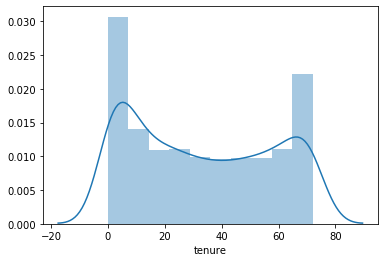

In [59]:

sns.distplot(testing.tenure)

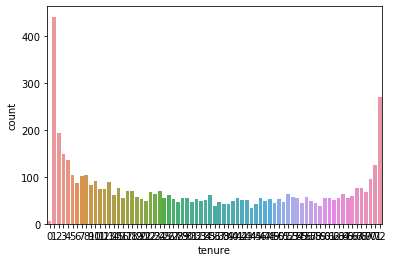

In [101]:
sns.countplot('tenure', data = training)

In [61]:
print('exporting file ' + filename + '.csv...' )

final_scores.to_csv(filename + '.csv', header = True)

exporting file Waggoner_scores_02-12-2020-09-52.csv...


In [62]:
""""clean_training = do_data(training, has_y = True, return_df = True )
pairs = sns.pairplot(clean_training,
                     diag_kind = 'hist', 
                     hue = 'churn')
plt.title('Pairwise plot of input variables, colored by churn')
plt.show()"""

'"clean_training = do_data(training, has_y = True, return_df = True )\npairs = sns.pairplot(clean_training,\n                     diag_kind = \'hist\', \n                     hue = \'churn\')\nplt.title(\'Pairwise plot of input variables, colored by churn\')\nplt.show()'

In [6]:
"""scikit-sirvival package install noworkey.  building ipc_weights function from source at :
https://github.com/sebp/scikit-survival/blob/master/sksurv/nonparametric.py"""

import numpy
from sklearn.base import BaseEstimator
from sklearn.utils.validation import check_array, check_consistent_length, check_is_fitted

def check_y_survival(y_or_event, *args, allow_all_censored=False):
    """Check that array correctly represents an outcome for survival analysis.
    Parameters
    ----------
    y_or_event : structured array with two fields, or boolean array
        If a structured array, it must contain the binary event indicator
        as first field, and time of event or time of censoring as
        second field. Otherwise, it is assumed that a boolean array
        representing the event indicator is passed.
    *args : list of array-likes
        Any number of array-like objects representing time information.
        Elements that are `None` are passed along in the return value.
    allow_all_censored : bool, optional, default: False
        Whether to allow all events to be censored.
    Returns
    -------
    event : array, shape=[n_samples,], dtype=bool
        Binary event indicator.
    time : array, shape=[n_samples,], dtype=float
        Time of event or censoring.
    """
    if len(args) == 0:
        y = y_or_event

        if not isinstance(y, numpy.ndarray) or y.dtype.fields is None or len(y.dtype.fields) != 2:
            raise ValueError('y must be a structured array with the first field'
                             ' being a binary class event indicator and the second field'
                             ' the time of the event/censoring')

        event_field, time_field = y.dtype.names
        y_event = y[event_field]
        time_args = (y[time_field],)
    else:
        y_event = numpy.asanyarray(y_or_event)
        time_args = args

    event = check_array(y_event, ensure_2d=False)
    if not numpy.issubdtype(event.dtype, numpy.bool_):
        raise ValueError('elements of event indicator must be boolean, but found {0}'.format(event.dtype))

    if not (allow_all_censored or numpy.any(event)):
        raise ValueError('all samples are censored')

    return_val = [event]
    for i, yt in enumerate(time_args):
        if yt is None:
            return_val.append(yt)
            continue

        yt = check_array(yt, ensure_2d=False)
        if not numpy.issubdtype(yt.dtype, numpy.number):
            raise ValueError('time must be numeric, but found {} for argument {}'.format(yt.dtype, i + 2))

        return_val.append(yt)

    return tuple(return_val)



def _compute_counts(event, time, order=None):
    """Count right censored and uncensored samples at each unique time point.
    Parameters
    ----------
    event : array
        Boolean event indicator.
    time : array
        Survival time or time of censoring.
    order : array or None
        Indices to order time in ascending order.
        If None, order will be computed.
    Returns
    -------
    times : array
        Unique time points.
    n_events : array
        Number of events at each time point.
    n_at_risk : array
        Number of samples that are censored or have an event at each time point.
    """
    n_samples = event.shape[0]

    if order is None:
        order = numpy.argsort(time, kind="mergesort")

    uniq_times = numpy.empty(n_samples, dtype=time.dtype)
    uniq_events = numpy.empty(n_samples, dtype=numpy.int_)
    uniq_counts = numpy.empty(n_samples, dtype=numpy.int_)

    i = 0
    prev_val = time[order[0]]
    j = 0
    while True:
        count_event = 0
        count = 0
        while i < n_samples and prev_val == time[order[i]]:
            if event[order[i]]:
                count_event += 1

            count += 1
            i += 1

        uniq_times[j] = prev_val
        uniq_events[j] = count_event
        uniq_counts[j] = count
        j += 1

        if i == n_samples:
            break

        prev_val = time[order[i]]

    times = numpy.resize(uniq_times, j)
    n_events = numpy.resize(uniq_events, j)
    total_count = numpy.resize(uniq_counts, j)

    # offset cumulative sum by one
    total_count = numpy.concatenate(([0], total_count))
    n_at_risk = n_samples - numpy.cumsum(total_count)

    return times, n_events, n_at_risk[:-1]


def _compute_counts_truncated(event, time_enter, time_exit):
    """Compute counts for left truncated and right censored survival data.
    Parameters
    ----------
    event : array
        Boolean event indicator.
    time_start : array
        Time when a subject entered the study.
    time_exit : array
        Time when a subject left the study due to an
        event or censoring.
    Returns
    -------
    times : array
        Unique time points.
    n_events : array
        Number of events at each time point.
    n_at_risk : array
        Number of samples that are censored or have an event at each time point.
    """
    if (time_enter > time_exit).any():
        raise ValueError("exit time must be larger start time for all samples")

    n_samples = event.shape[0]

    uniq_times = numpy.sort(numpy.unique(numpy.concatenate((time_enter, time_exit))), kind="mergesort")
    total_counts = numpy.empty(len(uniq_times), dtype=numpy.int_)
    event_counts = numpy.empty(len(uniq_times), dtype=numpy.int_)

    order_enter = numpy.argsort(time_enter, kind="mergesort")
    order_exit = numpy.argsort(time_exit, kind="mergesort")
    s_time_enter = time_enter[order_enter]
    s_time_exit = time_exit[order_exit]

    t0 = uniq_times[0]
    # everything larger is included
    idx_enter = numpy.searchsorted(s_time_enter, t0, side="right")
    # everything smaller is excluded
    idx_exit = numpy.searchsorted(s_time_exit, t0, side="left")

    total_counts[0] = idx_enter
    # except people die on the day they enter
    event_counts[0] = 0

    for i in range(1, len(uniq_times)):
        ti = uniq_times[i]

        while idx_enter < n_samples and s_time_enter[idx_enter] <= ti:
            idx_enter += 1

        while idx_exit < n_samples and s_time_exit[idx_exit] < ti:
            idx_exit += 1

        risk_set = numpy.setdiff1d(order_enter[:idx_enter], order_exit[:idx_exit], assume_unique=True)
        total_counts[i] = len(risk_set)

        count_event = 0
        k = idx_exit
        while k < n_samples and s_time_exit[k] == ti:
            if event[order_exit[k]]:
                count_event += 1
            k += 1
        event_counts[i] = count_event

    return uniq_times, event_counts, total_counts

def kaplan_meier_estimator(event, time_exit, time_enter=None, time_min=None):
    """Kaplan-Meier estimator of survival function.
    See [1]_ for further description.
    Parameters
    ----------
    event : array-like, shape = (n_samples,)
        Contains binary event indicators.
    time_exit : array-like, shape = (n_samples,)
        Contains event/censoring times.
    time_enter : array-like, shape = (n_samples,), optional
        Contains time when each individual entered the study for
        left truncated survival data.
    time_min : float, optional
        Compute estimator conditional on survival at least up to
        the specified time.
    Returns
    -------
    time : array, shape = (n_times,)
        Unique times.
    prob_survival : array, shape = (n_times,)
        Survival probability at each unique time point.
        If `time_enter` is provided, estimates are conditional probabilities.
    Examples
    --------
    Creating a Kaplan-Meier curve:
    >>> x, y = kaplan_meier_estimator(event, time)
    >>> plt.step(x, y, where="post")
    >>> plt.ylim(0, 1)
    >>> plt.show()
    References
    ----------
    .. [1] Kaplan, E. L. and Meier, P., "Nonparametric estimation from incomplete observations",
           Journal of The American Statistical Association, vol. 53, pp. 457-481, 1958.
    """
    event, time_enter, time_exit = check_y_survival(event, time_enter, time_exit, allow_all_censored=True)
    check_consistent_length(event, time_enter, time_exit)

    if time_enter is None:
        uniq_times, n_events, n_at_risk = _compute_counts(event, time_exit)
    else:
        uniq_times, n_events, n_at_risk = _compute_counts_truncated(event, time_enter, time_exit)

    values = 1 - n_events / n_at_risk

    if time_min is not None:
        mask = uniq_times >= time_min
        uniq_times = numpy.compress(mask, uniq_times)
        values = numpy.compress(mask, values)

    y = numpy.cumprod(values)
    return uniq_times, y

def ipc_weights(event, time):
    """Compute inverse probability of censoring weights
    Parameters
    ----------
    event : array, shape = (n_samples,)
        Boolean event indicator.
    time : array, shape = (n_samples,)
        Time when a subject experienced an event or was censored.
    Returns
    -------
    weights : array, shape = (n_samples,)
        inverse probability of censoring weights
    """
    if event.all():
        return numpy.ones(time.shape[0])

    unique_time, p = kaplan_meier_estimator(~event, time)

    idx = numpy.searchsorted(unique_time, time[event])
    Ghat = p[idx]

    assert (Ghat > 0).all()

    weights = numpy.zeros(time.shape[0])
    weights[event] = 1.0 / Ghat

    return weights

In [7]:
bools = training['Churn'].map({0:False, 1:True})
bools

0       False
1        True
2       False
3       False
4       False
        ...  
5277    False
5278    False
5279    False
5280    False
5281    False
Name: Churn, Length: 5282, dtype: bool

In [10]:
weights = ipc_weights(bools, training['tenure'])
weights[1]

1.103381794676502

In [163]:
training['tenure'].value_counts(bins = 20)

(-0.073, 3.6]    792
(68.4, 72.0]     560
(3.6, 7.2]       431
(10.8, 14.4]     301
(7.2, 10.8]      279
(14.4, 18.0]     275
(64.8, 68.4]     267
(21.6, 25.2]     254
(50.4, 54.0]     222
(28.8, 32.4]     209
(39.6, 43.2]     204
(32.4, 36.0]     198
(46.8, 50.4]     198
(57.6, 61.2]     192
(61.2, 64.8]     169
(25.2, 28.8]     161
(18.0, 21.6]     157
(54.0, 57.6]     150
(36.0, 39.6]     132
(43.2, 46.8]     131
Name: tenure, dtype: int64

In [165]:
# binning tenure into 20 bins
tenurebin = training['tenure'].value_counts(bins = 20)
training['tenurebin'] = 0
for i in range(0,len(training)):
    training['tenurebin'][i] = tenurebin.loc[training['tenure'].iloc[i]]

In [222]:
ps = training.drop(columns = ['Customer Number']).groupby('SeniorCitizen', as_index = False)
ps = ps.agg(['count','mean','max','min','sum']).reset_index()
ps

SeniorCitizen tenure                            MonthlyCharges             \
                 count       mean max min     sum          count       mean   
0             0   4451  31.967423  72   0  142287           4451  61.700876   
1             1    831  33.052948  72   1   27467            831  79.521059   

                           Churn                          \
      max    min       sum count      mean max min   sum   
0  118.75  18.25  274630.6  4451  0.236127   1   0  1051   
1  117.35  18.95   66082.0   831  0.412756   1   0   343   

  ps_SeniorCitizen_count                                    \
                   count         mean   max  min       sum   
0                   4451  4346.518535  4768  514  19346354   
1                    831  4394.303249  4768  514   3651666   

  ps_SeniorCitizen_mean                                            \
                  count      mean       max       min         sum   
0                  4451  0.157297  0.158977  0.142023  700.128101   
1                   831  0.157487  0.158977  0.142023  130.871899   

  ps_SeniorCitizen_max                    ps_SeniorCitizen_min               \
                 count mean max min   sum                count mean max min   
0                 4451    1   1   1  4451                 4451    0   0   0   
1                  831    1   1   1   831                  831    0   0   0   

      ps_SeniorCitizen_sum                               ps_tenure_count  \
  sum                count        mean  max min      sum           count   
0   0                 4451  690.130982  758  73  3071773            4451   
1   0                  831  697.825511  758  73   579893             831   

                                    ps_tenure_mean                        \
          mean   max  min       sum          count       mean        max   
0  4346.518535  4768  514  19346354           4451  32.135863  32.267198   
1  4394.303249  4768  514   3651666            831  32.150753  32.267198   

                            ps_tenure_max                      ps_tenure_min  \
         min            sum         count mean max min     sum         count   
0  30.941634  143036.724627          4451   72  72  72  320472          4451   
1  30.941634   26717.275373           831   72  72  72   59832           831   

                   ps_tenure_sum                                          \
  mean max min sum         count          mean     max    min        sum   
0    0   0   0   0          4451  140182.46776  153850  15904  623952164   
1    0   0   0   0           831  141732.00000  153850  15904  117779292   

  ps_MonthlyCharges_count                                    \
                    count         mean   max  min       sum   
0                    4451  4346.518535  4768  514  19346354   
1                     831  4394.303249  4768  514   3651666   

  ps_MonthlyCharges_mean                                                 \
                   count       mean        max        min           sum   
0                   4451  64.459949  66.955862  41.764689  286911.23433   
1                    831  64.742919  66.955862  41.764689   53801.36567   

  ps_MonthlyCharges_max                                      \
                  count        mean     max   min       sum   
0                  4451  113.642485  118.75  67.2  505822.7   
1                   831  114.221540  118.75  67.2   94918.1   

  ps_MonthlyCharges_min                                     \
                  count       mean    max    min       sum   
0                  4451  18.765210  23.45  18.25  83523.95   
1                   831  18.706799  23.45  18.25  15545.35   

  ps_MonthlyCharges_sum                                                    \
                  count           mean        max       min           sum   
0                  4451  289741.996080  319245.55  21467.05  1.289642e+09   
1                   831  293086.909206  319245.55  21467.05  2.435552e+08   



In [223]:
columns = ['SeniorCitizen']
for i in ps.columns.levels[0]:
    if i != 'SeniorCitizen':
        for j in ps.columns.levels[1][:-1]:
            columns.append('ps_%s_%s' % (i,j))

ps.columns = columns


In [224]:
training = training.merge(ps,
                         on = 'SeniorCitizen',
                         how = 'left')
training

,Customer Number,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,ps_SeniorCitizen_count,ps_SeniorCitizen_mean,ps_SeniorCitizen_max,ps_SeniorCitizen_min,ps_SeniorCitizen_sum,ps_tenure_count_x,ps_tenure_mean_x,ps_tenure_max_x,ps_tenure_min_x,ps_tenure_sum_x,ps_MonthlyCharges_count_x,ps_MonthlyCharges_mean_x,ps_MonthlyCharges_max_x,ps_MonthlyCharges_min_x,ps_MonthlyCharges_sum_x,ps_Churn_count_x,ps_Churn_mean_x,ps_Churn_max_x,ps_Churn_min_x,ps_Churn_sum_x,ps_tenure_count_y,ps_tenure_mean_y,ps_tenure_max_y,ps_tenure_min_y,ps_tenure_sum_y,ps_MonthlyCharges_count_y,ps_MonthlyCharges_mean_y,ps_MonthlyCharges_max_y,ps_MonthlyCharges_min_y,ps_MonthlyCharges_sum_y,ps_Churn_count_y,ps_Churn_mean_y,ps_Churn_max_y,ps_Churn_min_y,ps_Churn_sum_y,ps_ps_SeniorCitizen_count_count,ps_ps_SeniorCitizen_count_mean,ps_ps_SeniorCitizen_count_max,ps_ps_SeniorCitizen_count_min,ps_ps_SeniorCitizen_count_sum,ps_ps_SeniorCitizen_mean_count,ps_ps_SeniorCitizen_mean_mean,ps_ps_SeniorCitizen_mean_max,ps_ps_SeniorCitizen_mean_min,ps_ps_SeniorCitizen_mean_sum,ps_ps_SeniorCitizen_max_count,ps_ps_SeniorCitizen_max_mean,ps_ps_SeniorCitizen_max_max,ps_ps_SeniorCitizen_max_min,ps_ps_SeniorCitizen_max_sum,ps_ps_SeniorCitizen_min_count,ps_ps_SeniorCitizen_min_mean,ps_ps_SeniorCitizen_min_max,ps_ps_SeniorCitizen_min_min,ps_ps_SeniorCitizen_min_sum,ps_ps_SeniorCitizen_sum_count,ps_ps_SeniorCitizen_sum_mean,ps_ps_SeniorCitizen_sum_max,ps_ps_SeniorCitizen_sum_min,ps_ps_SeniorCitizen_sum_sum,ps_ps_tenure_count_count,ps_ps_tenure_count_mean,ps_ps_tenure_count_max,ps_ps_tenure_count_min,ps_ps_tenure_count_sum,ps_ps_tenure_mean_count,ps_ps_tenure_mean_mean,ps_ps_tenure_mean_max,ps_ps_tenure_mean_min,ps_ps_tenure_mean_sum,ps_ps_tenure_max_count,ps_ps_tenure_max_mean,ps_ps_tenure_max_max,ps_ps_tenure_max_min,ps_ps_tenure_max_sum,ps_ps_tenure_min_count,ps_ps_tenure_min_mean,ps_ps_tenure_min_max,ps_ps_tenure_min_min,ps_ps_tenure_min_sum,ps_ps_tenure_sum_count,ps_ps_tenure_sum_mean,ps_ps_tenure_sum_max,ps_ps_tenure_sum_min,ps_ps_tenure_sum_sum,ps_ps_MonthlyCharges_count_count,ps_ps_MonthlyCharges_count_mean,ps_ps_MonthlyCharges_count_max,ps_ps_MonthlyCharges_count_min,ps_ps_MonthlyCharges_count_sum,ps_ps_MonthlyCharges_mean_count,ps_ps_MonthlyCharges_mean_mean,ps_ps_MonthlyCharges_mean_max,ps_ps_MonthlyCharges_mean_min,ps_ps_MonthlyCharges_mean_sum,ps_ps_MonthlyCharges_max_count,ps_ps_MonthlyCharges_max_mean,ps_ps_MonthlyCharges_max_max,ps_ps_MonthlyCharges_max_min,ps_ps_MonthlyCharges_max_sum,ps_ps_MonthlyCharges_min_count,ps_ps_MonthlyCharges_min_mean,ps_ps_MonthlyCharges_min_max,ps_ps_MonthlyCharges_min_min,ps_ps_MonthlyCharges_min_sum,ps_ps_MonthlyCharges_sum_count,ps_ps_MonthlyCharges_sum_mean,ps_ps_MonthlyCharges_sum_max,ps_ps_MonthlyCharges_sum_min,ps_ps_MonthlyCharges_sum_sum,ps_ps_Churn_count_count,ps_ps_Churn_count_mean,ps_ps_Churn_count_max,ps_ps_Churn_count_min,ps_ps_Churn_count_sum,ps_ps_Churn_mean_count,ps_ps_Churn_mean_mean,ps_ps_Churn_mean_max,ps_ps_Churn_mean_min,ps_ps_Churn_mean_sum,ps_ps_Churn_max_count,ps_ps_Churn_max_mean,ps_ps_Churn_max_max,ps_ps_Churn_max_min,ps_ps_Churn_max_sum,ps_ps_Churn_min_count,ps_ps_Churn_min_mean,ps_ps_Churn_min_max,ps_ps_Churn_min_min,ps_ps_Churn_min_sum,ps_ps_Churn_sum_count,ps_ps_Churn_sum_mean,ps_ps_Churn_sum_max,ps_ps_Churn_sum_min,ps_ps_Churn_sum_sum
0,0980-PVMRC,Female,0,Yes,Yes,40,No,No phone service,DSL,No,Yes,No,No,Yes,Yes,Month-to-month,Yes,Electronic check,50.85,2036.55,0,514,0.142023,1,0,73,514,30.941634,72,0,15904,514,41.764689,67.20,23.45,21467.05,514,0.256809,1,0,132,4451,31.967423,72,0,142287,4451,61.700876,118.75,18.25,274630.6,4451,0.236127,1,0,1051,4451,4346.518535,4768,514,19346354,4451,0.157297,0.158977,0.142023,700.128101,4451,1,1,1,4451,4451,0,0,0,0,4451,690.130982,758,73,3071773,4451,4346.518535,4768,514,193463

In [209]:
training


,customer number,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,onlinebackup,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn,max_minus_tenure,risk,bandwidth_use,mismatch,tenurebin,gender_tenure_count_x,gender_tenure_mean_x,gender_tenure_max_x,gender_tenure_min_x,gender_tenure_sum_x,gender_monthlycharges_count_x,gender_monthlycharges_mean_x,gender_monthlycharges_max_x,gender_monthlycharges_min_x,gender_monthlycharges_sum_x,gender_totalcharges_count_x,gender_totalcharges_mean_x,gender_totalcharges_max_x,gender_totalcharges_min_x,gender_totalcharges_sum_x,gender_churn_count_x,gender_churn_mean_x,gender_churn_max_x,gender_churn_min_x,gender_churn_sum_x,gender_max_minus_tenure_count_x,gender_max_minus_tenure_mean_x,gender_max_minus_tenure_max_x,gender_max_minus_tenure_min_x,gender_max_minus_tenure_sum_x,gender_tenurebin_count_x,gender_tenurebin_mean_x,gender_tenurebin_max_x,gender_tenurebin_min_x,gender_tenurebin_sum_x,gender_tenure_count_y,gender_tenure_mean_y,gender_tenure_max_y,gender_tenure_min_y,gender_tenure_sum_y,gender_monthlycharges_count_y,gender_monthlycharges_mean_y,gender_monthlycharges_max_y,gender_monthlycharges_min_y,gender_monthlycharges_sum_y,gender_totalcharges_count_y,gender_totalcharges_mean_y,gender_totalcharges_max_y,gender_totalcharges_min_y,gender_totalcharges_sum_y,gender_churn_count_y,gender_churn_mean_y,gender_churn_max_y,gender_churn_min_y,gender_churn_sum_y,gender_max_minus_tenure_count_y,gender_max_minus_tenure_mean_y,gender_max_minus_tenure_max_y,gender_max_minus_tenure_min_y,gender_max_minus_tenure_sum_y,gender_tenurebin_count_y,gender_tenurebin_mean_y,gender_tenurebin_max_y,gender_tenurebin_min_y,gender_tenurebin_sum_y,gender_gender_tenure_count_count_x,gender_gender_tenure_count_mean_x,gender_gender_tenure_count_max_x,gender_gender_tenure_count_min_x,gender_gender_tenure_count_sum_x,gender_gender_tenure_mean_count_x,gender_gender_tenure_mean_mean_x,gender_gender_tenure_mean_max_x,gender_gender_tenure_mean_min_x,gender_gender_tenure_mean_sum_x,gender_gender_tenure_max_count_x,gender_gender_tenure_max_mean_x,gender_gender_tenure_max_max_x,gender_gender_tenure_max_min_x,gender_gender_tenure_max_sum_x,gender_gender_tenure_min_count_x,gender_gender_tenure_min_mean_x,gender_gender_tenure_min_max_x,gender_gender_tenure_min_min_x,gender_gender_tenure_min_sum_x,gender_gender_tenure_sum_count_x,gender_gender_tenure_sum_mean_x,gender_gender_tenure_sum_max_x,gender_gender_tenure_sum_min_x,gender_gender_tenure_sum_sum_x,gender_gender_monthlycharges_count_count_x,gender_gender_monthlycharges_count_mean_x,gender_gender_monthlycharges_count_max_x,gender_gender_monthlycharges_count_min_x,gender_gender_monthlycharges_count_sum_x,gender_gender_monthlycharges_mean_count_x,gender_gender_monthlycharges_mean_mean_x,gender_gender_monthlycharges_mean_max_x,gender_gender_monthlycharges_mean_min_x,gender_gender_monthlycharges_mean_sum_x,gender_gender_monthlycharges_max_count_x,gender_gender_monthlycharges_max_mean_x,gender_gender_monthlycharges_max_max_x,gender_gender_monthlycharges_max_min_x,gender_gender_monthlycharges_max_sum_x,gender_gender_monthlycharges_min_count_x,gender_gender_monthlycharges_min_mean_x,gender_gender_monthlycharges_min_max_x,gender_gender_monthlycharges_min_min_x,gender_gender_monthlycharges_min_sum_x,gender_gender_monthlycharges_sum_count_x,gender_gender_monthlycharges_sum_mean_x,gender_gender_monthlycharges_sum_max_x,gender_gender_monthlycharges_sum_min_x,gender_gender_monthlycharges_sum_sum_x,gender_gender_totalcharges_count_count_x,gender_gender_totalcharges_count_mean_x,gender_gender_totalcharges_count_max_x,gender_gender_totalcharges_count_min_x,gender_gender_totalcharges_count_sum_x,gender_gender_totalcharges_mean_count_x,gender_gender_totalcharges_mean_mean_x,gender_gender_totalcharges_mean_max_x,gender_gender_totalcharges_mean_min_x,gender_gender_totalc

In [190]:
training['seniorcitizen'] = training['seniorcitizen'].map({0:'No', 1:'Yes'})

In [233]:

def aggy(df, column):
    agg_df = df.drop(columns = ['Customer Number']).groupby(column, as_index = False)\
                                .agg(['count', 'mean', 'max', 'min', 'sum', 'std']).reset_index()
    columns = [column]
    for i in agg_df.columns.levels[0]:
        if i != column:
            for j in agg_df.columns.levels[1][:-1]:
                columns.append('%s_%s_%s' % (column,i,j))

    agg_df.columns = columns
    
    return agg_df
   


In [234]:
training = training.merge(aggy(training, 'MultipleLines'),
                          on = 'MultipleLines',
                          how = 'left')

training

Customer Number  gender  SeniorCitizen Partner Dependents  tenure  \
0         0980-PVMRC  Female              0     Yes        Yes      40   
1         4143-OOBWZ    Male              0     Yes         No       5   
2         4890-VMUAV    Male              0      No         No      63   
3         2908-ZTPNF  Female              0      No         No      36   
4         4450-MDZFX    Male              0     Yes        Yes      60   
...              ...     ...            ...     ...        ...     ...   
5277      7869-ZYDST    Male              0     Yes         No      31   
5278      2842-BCQGE    Male              0      No         No      43   
5279      9800-OUIGR    Male              0     Yes        Yes      66   
5280      7301-ABVAD  Female              0      No         No      72   
5281      2916-BQZLN    Male              0      No         No      19   

     PhoneService     MultipleLines InternetService       OnlineSecurity  \
0              No  No phone service             DSL                   No   
1             Yes               Yes     Fiber optic                   No   
2             Yes               Yes             DSL                  Yes   
3              No  No phone service             DSL                   No   
4             Yes               Yes     Fiber optic                   No   
...           ...               ...             ...                  ...   
5277          Yes               Yes             DSL                   No   
5278          Yes               Yes     Fiber optic                   No   
5279          Yes                No              No  No internet service   
5280          Yes               Yes             DSL                   No   
5281          Yes               Yes     Fiber optic                  Yes   

             OnlineBackup     DeviceProtection          TechSupport  \
0                     Yes                   No                   No   
1                     Yes                   No                   No   
2                     Yes                  Yes                  Yes   
3                     Yes                   No                  Yes   
4                      No                   No                   No   
...                   ...                  ...                  ...   
5277                   No                   No                   No   
5278                   No                   No                   No   
5279  No internet service  No internet service  No internet service   
5280                  Yes                  Yes                  Yes   
5281                   No                  Yes                   No   

              StreamingTV      StreamingMovies        Contract  \
0                     Yes                  Yes  Month-to-month   
1                      No                   No  Month-to-month   
2                      No                   No        One year   
3                      No                   No  Month-to-month   
4                      No                   No  Month-to-month   
...                   ...                  ...             ...   
5277                  Yes                   No  Month-to-month   
5278                   No                   No  Month-to-month   
5279  No internet service  No internet service        Two year   
5280                  Yes                  Yes        Two year   
5281                   No                   No  Month-to-month   

     PaperlessBilling              PaymentMethod  MonthlyCharges TotalCharges  \
0                 Yes           Electronic check           50.85      2036.55   
1                 Yes           Electronic check           81.30        416.3   
2                  No           Electronic check           71.50       4576.3   
3                 Yes  Bank transfer (automatic)           34.85       1267.2   
4                  No  Bank transfer (automatic)           74.35       4453.3   
...               ...                        ...             ...       